# Fit the Data Spectra using simulations as models

- author Sylvie Dagoret-Campagne
- creation date : May 8th 2018
- affliliation : CNRS/IN2P3
- project : DESC-LSST



- need to increase the number of files to be open:

    ulimit -a
    
    ulimit -n 2048
    
    ulimit -Sn 10000

In [95]:
!ulimit -a

core file size          (blocks, -c) 0
data seg size           (kbytes, -d) unlimited
file size               (blocks, -f) unlimited
max locked memory       (kbytes, -l) unlimited
max memory size         (kbytes, -m) unlimited
open files                      (-n) 2048
pipe size            (512 bytes, -p) 1
stack size              (kbytes, -s) 8192
cpu time               (seconds, -t) unlimited
max user processes              (-u) 2837
virtual memory          (kbytes, -v) unlimited


## Setup

### Notebook style

In [96]:
from IPython.core.display import HTML
def css_styling():
    styles = open("../styles/custom.css", "r").read()
    return HTML(styles)
css_styling()

### import

In [97]:
import matplotlib.pyplot as plt
import sys
import os
import pandas as pd
import glob
from matplotlib.backends.backend_pdf import PdfPages 

In [98]:
import seaborn as sns

In [99]:
from scipy.optimize import curve_fit
from scipy import interpolate

In [100]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Figure style

In [101]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 10),   #defines the default image size
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [102]:
plt.rcParams.update({'figure.max_open_warning': 0}) # to see a large number of files

## Initialisation

### Spectractor

In [103]:
PATH_SPECTRACTOR='../../Spectractor'
PATH_SPECTRACTORSIM='../../SpectractorSim'
PATH_SPECTRACTORANAATM='../../SpectractorAnaAtm/common_tools'
PATH_GMAOMERRA='../merra2'

In [104]:
sys.path.append(PATH_SPECTRACTOR)
sys.path.append(PATH_SPECTRACTORSIM)
sys.path.append(PATH_SPECTRACTORANAATM)
sys.path.append(PATH_GMAOMERRA)

In [105]:
from spectractor import *
from libspecana import *
from spectractorsim import *

## Input spectra

### LogBook

In [106]:
file_logbook_csv=os.path.join(PATH_SPECTRACTOR,'ctiofulllogbook_jun2017_v4.csv')

In [107]:
df_ctio_lbk=pd.read_csv(file_logbook_csv,sep=';')

In [108]:
df_ctio_lbk.columns

Index([u'Unnamed: 0', u'date', u'subdir', u'index', u'object', u'filter',
       u'disperser', u'airmass', u'exposure', u'focus', u'seeing', u'P', u'T',
       u'RH', u'W', u'file', u'Obj-posXpix', u'Obj-posYpix', u'Dx', u'Dy',
       u'comment', u'skip'],
      dtype='object')

In [109]:
df_ctio_lbk=df_ctio_lbk.reindex(columns=['date','index','P','T','RH','airmass','seeing','exposure','object','filter','disperser','focus','W','subdir','file']).set_index('date').sort_index()

### Spectra Data

In [110]:
home=os.getenv('HOME')

In [111]:
path_data=os.path.join(home,'DATA/CTIODataJune2017_reduced_RG715_v2_prod1')
#path_data=os.path.join('/sps/lsst/data/AtmosphericCalibration','CTIODataJune2017_reduced_RG715_v2_prod1')

In [112]:
All_Subdirs=np.array(['data_28may17','data_29may17','data_30may17','data_31may17','data_01jun17','data_02jun17',
            'data_03jun17','data_04jun17','data_06jun17','data_08jun17','data_09jun17','data_10jun17',
            'data_12jun17','data_13jun17'])

In [113]:
Flag_Photometric_Nights=np.array([False,False,True,False,False,False,False,False,False,True,False,True,True,False])

In [114]:
photometric_indexes=np.where(Flag_Photometric_Nights)[0]

In [115]:
print 'Photometric indexes : ',photometric_indexes

Photometric indexes :  [ 2  9 11 12]


In [116]:
print 'Photometric nights : ',All_Subdirs[photometric_indexes]

Photometric nights :  ['data_30may17' 'data_08jun17' 'data_10jun17' 'data_12jun17']


### Sim spectra

In [117]:
PATH_SPECTRACTORSIM

'../../SpectractorSim'

In [118]:
# laptop:
path_sim=os.path.join(PATH_SPECTRACTORSIM,'sim_prod/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra')
# CCIN2P3:
#path_sim=PATH_SPECTRACTORSIM+'/sim_prod/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra'
# Office desktop
home=os.getenv('HOME')
path_sim=os.path.join(home,'DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra')

In [119]:
path_sim

'/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra'

## Selection of night

In [120]:
date="20170612"

In [121]:
idx_sel_subdir=12

In [122]:
SelectTagRe='^reduc_%s_([0-9]+)_spectrum.fits$' % (date)

### Logbook

In [123]:
all_obs=df_ctio_lbk.loc[(df_ctio_lbk["subdir"]==All_Subdirs[idx_sel_subdir])].sort_index()

In [124]:
all_obs_extr=all_obs[["index","object"]]

### path for spectra

In [125]:
path_spectra=os.path.join(path_data,All_Subdirs[idx_sel_subdir])
path_spectrasim=os.path.join(path_sim,All_Subdirs[idx_sel_subdir])

### find filename for data spectra

In [126]:
search_string=os.path.join(path_spectra,'*.fits')
all_spectrafiles=glob.glob(search_string)
all_spectrafiles=sorted(all_spectrafiles)

### extract the index from the data spectra filename

In [127]:
#SelectTagRe='^reduc_%s_([0-9]+)_spectrum.fits$' % (date)
all_sel_indexes=[]
for ffn in all_spectrafiles:
    all_sel_indexes.append(get_index_from_filename(ffn,SelectTagRe))
all_sel_indexes=np.array(all_sel_indexes)  

### extract the logbook rows

- use the indexes obtained to extract the relevant rows from the logbook

In [128]:
SelFlag=[]
for index, row in all_obs.iterrows():
  if row["index"] in all_sel_indexes:
    SelFlag.append(True)
  else:
    SelFlag.append(False)

In [129]:
sel_obs=all_obs[SelFlag]

### Quick view on the kind of sources

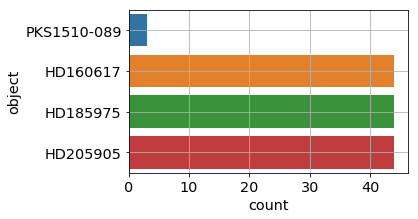

In [130]:
plt.figure(figsize=(5,3))
sns.countplot(y='object', data=sel_obs)
plt.grid(True)

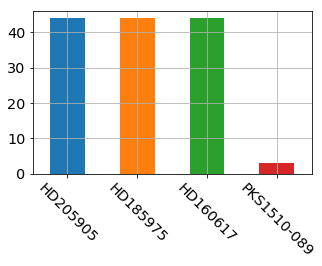

In [131]:
plt.figure(figsize=(5,3))
sel_obs['object'].value_counts().plot(kind='bar',rot=0)
plt.xticks(rotation=-45)
plt.grid(True)

### Remove bad sources

In [132]:
bad_obs=sel_obs.loc[sel_obs['object'].isin(['PKS1510-089'])]
bad_indexes=bad_obs["index"]

In [133]:
bad_obs

,index,P,T,RH,airmass,seeing,exposure,object,filter,disperser,focus,W,subdir,file
date,,,,,,,,,,,,,,
2017-06-13T00:24:20.451,41,779,"10,8",0,"1,239","0,792",600,PKS1510-089,dia,HoloPhP,12300,"12,3",data_12jun17,reduc_20170612_041.fits
2017-06-13T00:58:25.646,42,779,"10,5",31,"1,156","0,892",3600,PKS1510-089,dia,HoloPhP,12300,"13,1",data_12jun17,reduc_20170612_042.fits
2017-06-13T02:23:08.847,44,779,"9,7",0,"1,072","1,042",3600,PKS1510-089,dia,HoloPhAg,12300,"14,4",data_12jun17,reduc_20170612_044.fits


In [134]:
bad_indexes=bad_obs.loc[:,"index"]

In [135]:
bad_indexes.index

Index([u'2017-06-13T00:24:20.451', u'2017-06-13T00:58:25.646',
       u'2017-06-13T02:23:08.847'],
      dtype='object', name=u'date')

In [136]:
bad_indexes.values

array([41, 42, 44])

### Remove bad indexes

In [137]:
file_toremove=[]
SelectTagRe='^reduc_%s_([0-9]+)_spectrum.fits$' % (date)
for ffn in all_spectrafiles:
    fn=ffn.split('/')[-1]
    sel_index= int(re.findall(SelectTagRe,fn)[0])
    if sel_index in bad_indexes.values:
        print ' remove ', fn
        file_toremove.append(ffn)
for f in file_toremove:
    all_spectrafiles.remove(f)       

 remove  reduc_20170612_041_spectrum.fits
 remove  reduc_20170612_042_spectrum.fits
 remove  reduc_20170612_044_spectrum.fits


In [138]:
sel2_obs=sel_obs.loc[sel_obs['object'].isin(['HD160617','HD185975','HD205905'])]

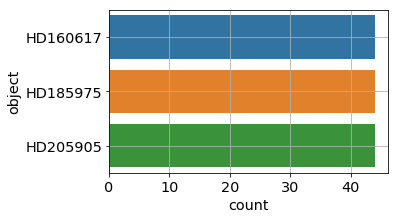

In [139]:
plt.figure(figsize=(5,3))
sns.countplot(y='object', data=sel2_obs)
plt.grid(True)

### Bad reconstructed spectra

In [140]:
bad_calib_indexes=np.array([48,49,50,168])

## Remove bad indexes

In [141]:
file_toremove=[]
#SelectTagRe='^reduc_%s_([0-9]+)_spectrum.fits$' % (date)
for ffn in all_spectrafiles:
    fn=ffn.split('/')[-1]
    sel_index= int(re.findall(SelectTagRe,fn)[0])
    if sel_index in bad_calib_indexes:
        print ' remove ', fn
        file_toremove.append(ffn)
for f in file_toremove:
    all_spectrafiles.remove(f) 

 remove  reduc_20170612_048_spectrum.fits
 remove  reduc_20170612_049_spectrum.fits
 remove  reduc_20170612_050_spectrum.fits
 remove  reduc_20170612_168_spectrum.fits


### find filename for sim spectra

In [142]:
path_sim1=os.path.join(path_spectrasim,'clearsky')
path_sim2=os.path.join(path_spectrasim,'standard')
path_sim3=os.path.join(path_spectrasim,'merra2')

In [143]:
search_string=os.path.join(path_sim1,'*.fits')
all_simspectrafiles1=glob.glob(search_string)
all_simspectrafiles1=sorted(all_simspectrafiles1)

In [144]:
all_simspectrafiles1[:3]

['/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/clearsky/specsim_20170612_041_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/clearsky/specsim_20170612_042_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/clearsky/specsim_20170612_044_spectrum.fits']

In [145]:
search_string=os.path.join(path_sim2,'*.fits')
all_simspectrafiles2=glob.glob(search_string)
all_simspectrafiles2=sorted(all_simspectrafiles2)

In [146]:
all_simspectrafiles2[:3]

['/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/standard/specsim_20170612_041_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/standard/specsim_20170612_042_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/standard/specsim_20170612_044_spectrum.fits']

In [147]:
search_string=os.path.join(path_sim3,'*.fits')
all_simspectrafiles3=glob.glob(search_string)
all_simspectrafiles3=sorted(all_simspectrafiles3)

In [148]:
all_simspectrafiles3[:3]

['/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/merra2/specsim_20170612_041_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/merra2/specsim_20170612_042_spectrum.fits',
 '/Users/dagoret/DATA/CTIODataJune2017_reduced_RG715_v2_prod1_SimSpectra/data_12jun17/merra2/specsim_20170612_044_spectrum.fits']

# Example of a fit on spectrum

In [149]:
spectrum_sel=6
O2WL=762.1

In [150]:
s0=np.ones(len(WL))

In [151]:
def functofit_bad(x, x0, a, b):
    
    return np.where(x>x0, (a * (x-x0) * np.exp(-b * (x-x0) ))*s0,0)

In [152]:
def functofit(x, x0, a, b):
    """
    functofit : function to fit relative attenuation of data wrt simulation
    """
    return np.where(x>x0, (a + b * (x-x0) )*s0,0)

[ 3.00000000e+02  1.75945530e+00 -3.18386101e-03]


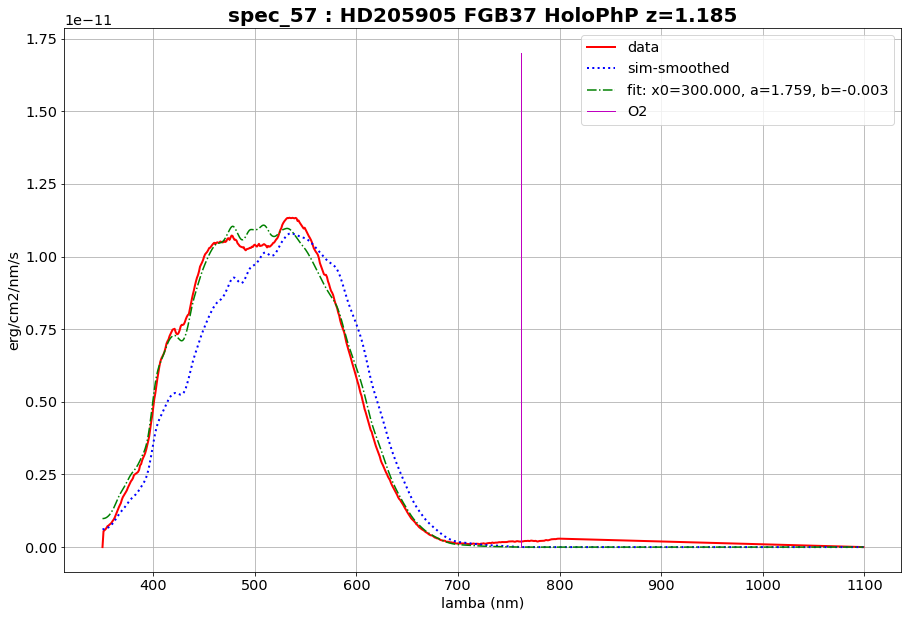

In [153]:
idx=spectrum_sel
filename=all_spectrafiles[idx]
file_id=get_index_from_filename(filename,SelectTagRe)
    
# check if tthe index is in the disperser indexes 
basefn=os.path.basename(filename)                  # basename of reconstruced spectra
basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
        
hdu1 = fits.open(filename)
hdu2 = fits.open(simfilename)
       
data1=hdu1[0].data
head1=hdu1[0].header
    
wl1=data1[0]
f1=data1[1]
   
hdu2 = fits.open(simfilename)
data2=hdu2[0].data
    
wl2=data2[0]
f2=data2[1]
f3=smooth(f2,window_len=21)

gain=f1.max()/f2.max()
f2=f3*gain

# extend range for (wl1,f1)
wl1=np.insert(wl1,0,WL[0])
f1=np.insert(f1,0,0.)            
wl1=np.append(wl1,WL[-1])
f1=np.append(f1,0.)

# extend range for (wl2,f3)
wl2=np.insert(wl2,0,WL[0])
f2=np.insert(f2,0,0.)            
wl2=np.append(wl2,WL[-1])
f2=np.append(f2,0.)


func1 = interpolate.interp1d(wl1, f1)
fl1=func1(WL)

func2 = interpolate.interp1d(wl2, f2)
fl2=func2(WL)

s0=fl2

if head1["FILTER2"]=='RG715':
    popt, pcov = curve_fit(functofit, WL, fl1,p0=[550.,1.,0.])
else:
    popt, pcov = curve_fit(functofit, WL, fl1,p0=[300.,1.,0.])

print popt

figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
plt.title(figtitle,fontsize='20',fontweight='bold')
#plt.plot(wl1,f1,'r-',lw=2,label='data')
plt.plot(WL,fl1,'r-',lw=2,label='data')
    
#plt.plot(wl2,f2*gain,'b-',lw=2,label='sim')
#plt.plot(wl2,f3*gain,'b:',lw=2,label='sim-smoothed')
plt.plot(WL,fl2,'b:',lw=2,label='sim-smoothed')

s0=fl2
plt.plot(WL,functofit(WL, *popt), 'g-.',label='fit: x0=%5.3f, a=%5.3f, b=%5.3f' % tuple(popt))


plt.plot([O2WL,O2WL],[0.,f1.max()*1.5],'m-',lw=1,label='O2')
plt.xlabel("lamba (nm)")
plt.ylabel("erg/cm2/nm/s")
plt.grid(True)
plt.legend()

# Plot spectra

In [154]:
NBSPECTRA=len(all_spectrafiles)

In [155]:
NBPLOTS=NBSPECTRA

In [156]:
O2WL=762.1

In [157]:
def ShiftSpectrum(wl,flux,wlline=O2WL,wlmin=O2WL-40.,wlmax=O2WL+40.):
    """
    Function. ShiftSpectrum(wl,flux,wlline=O2WL,wlmin=O2WL-10.,wlmax=O2WL+10.)
    
    Function to adjust the wavelength calibration by shifting a little bit the wavelength axis, such
    O2 lines are aligned.
    
    
    input:
       wl,flux: the whole wavelength and flux of spectrum
       wlline=O2WL    : wavelength on which to aligh the spectra
       wlmin=O2WL-10. : boundary of adjustment 
       wlmax=O2WL+10. : boundary of adjustment 
    
    
    """
    shiftwl=0
    
    index_selection=np.where(np.logical_and(wl>=wlmin,wl<=wlmax))[0]
    #print index_selection
    if index_selection.size !=0:
        wl_subset=wl[index_selection]
        flux_subset=flux[index_selection]
        the_flux_min_idx=np.where(flux_subset==flux_subset.min())[0]
        if the_flux_min_idx.size==1:
            the_flux_min_index=index_selection[the_flux_min_idx[0]]
            shiftwl=O2WL-wl[the_flux_min_index]
            #print the_flux_min_index, shiftwl
    return shiftwl

# First step : Correct for unknown attenuation 

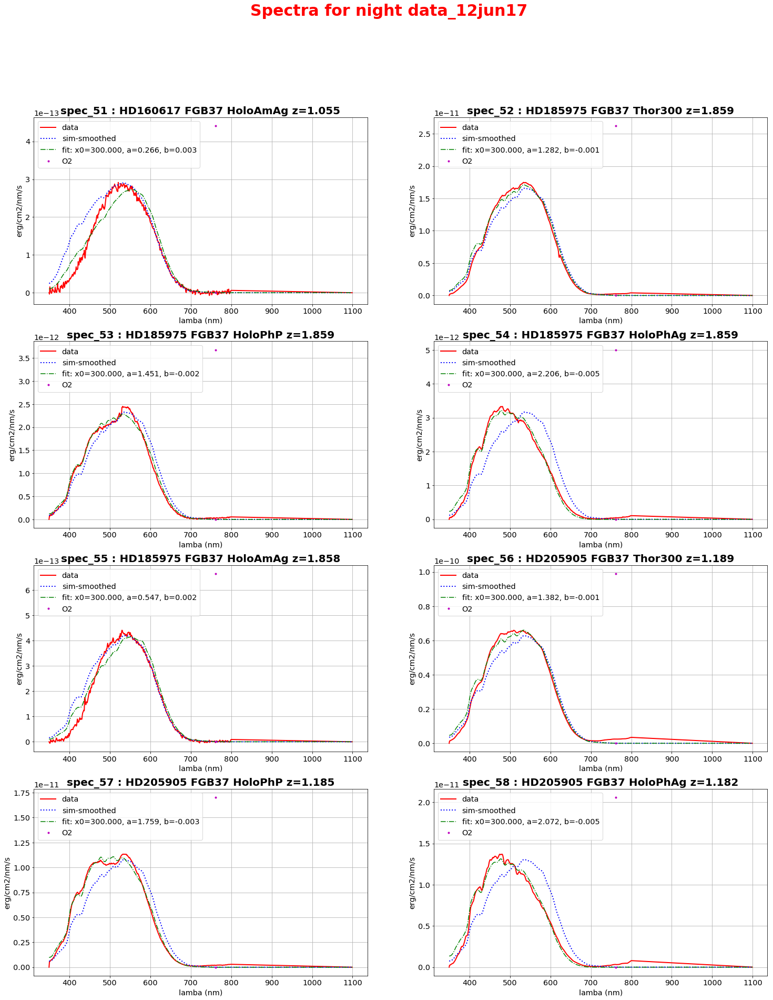

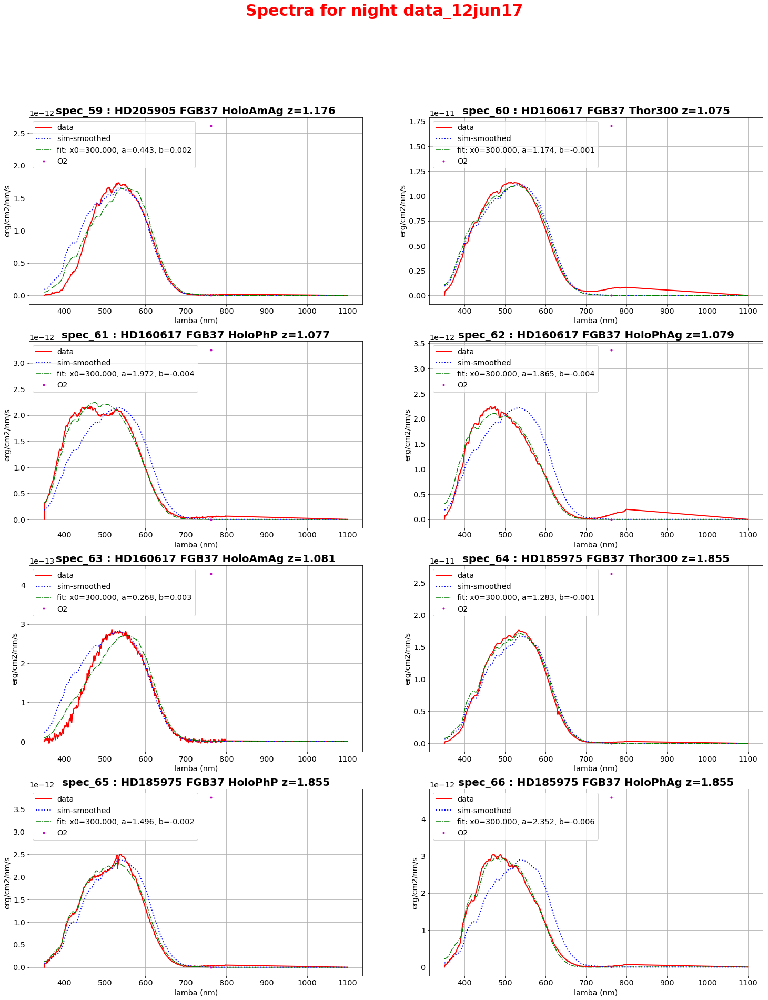

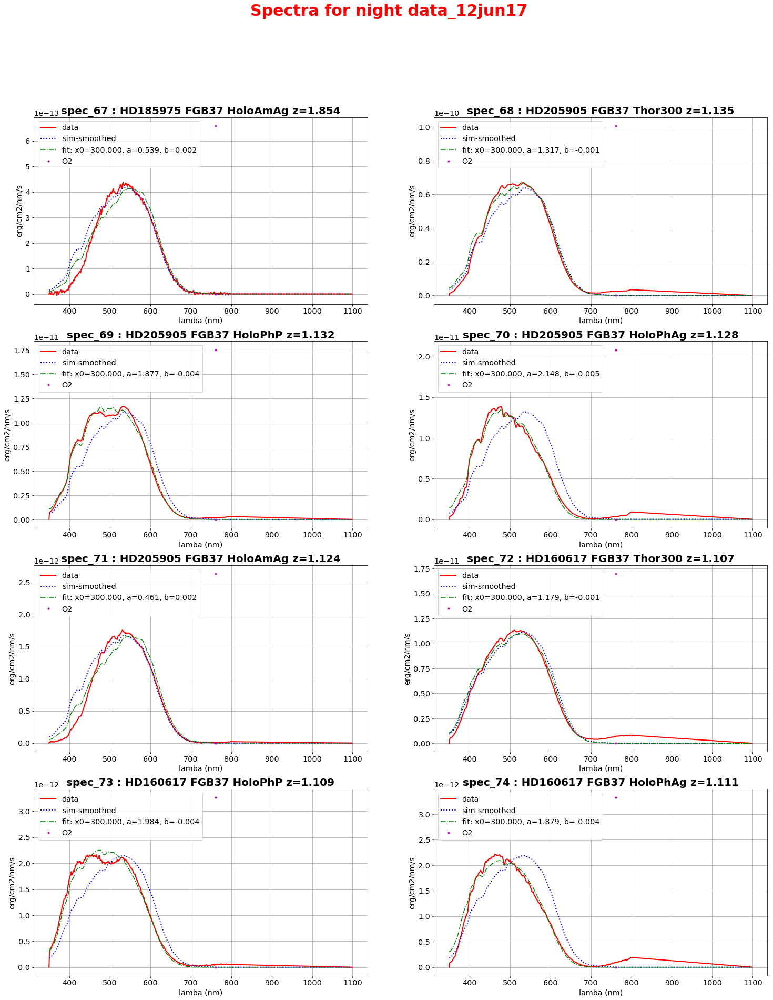

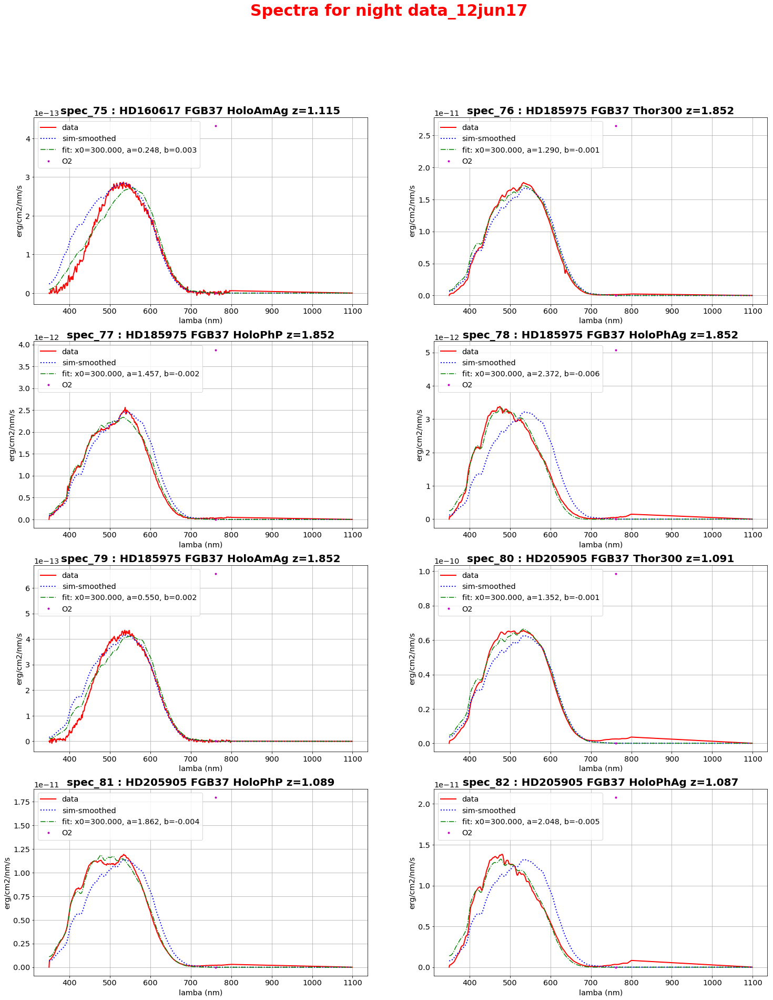

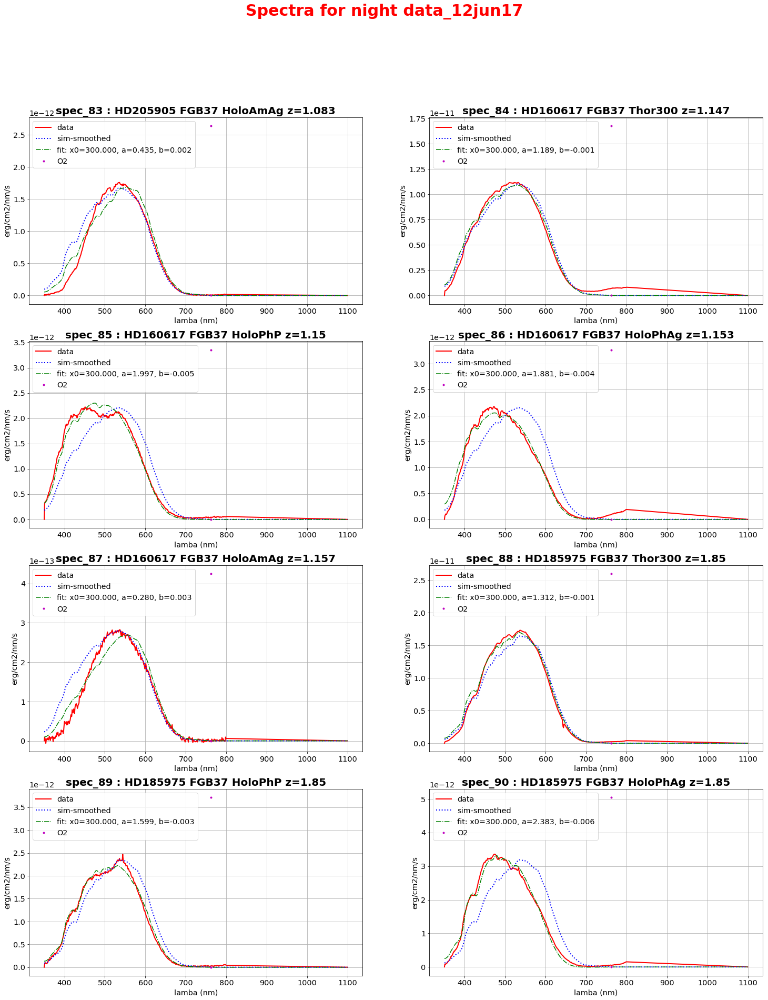

...

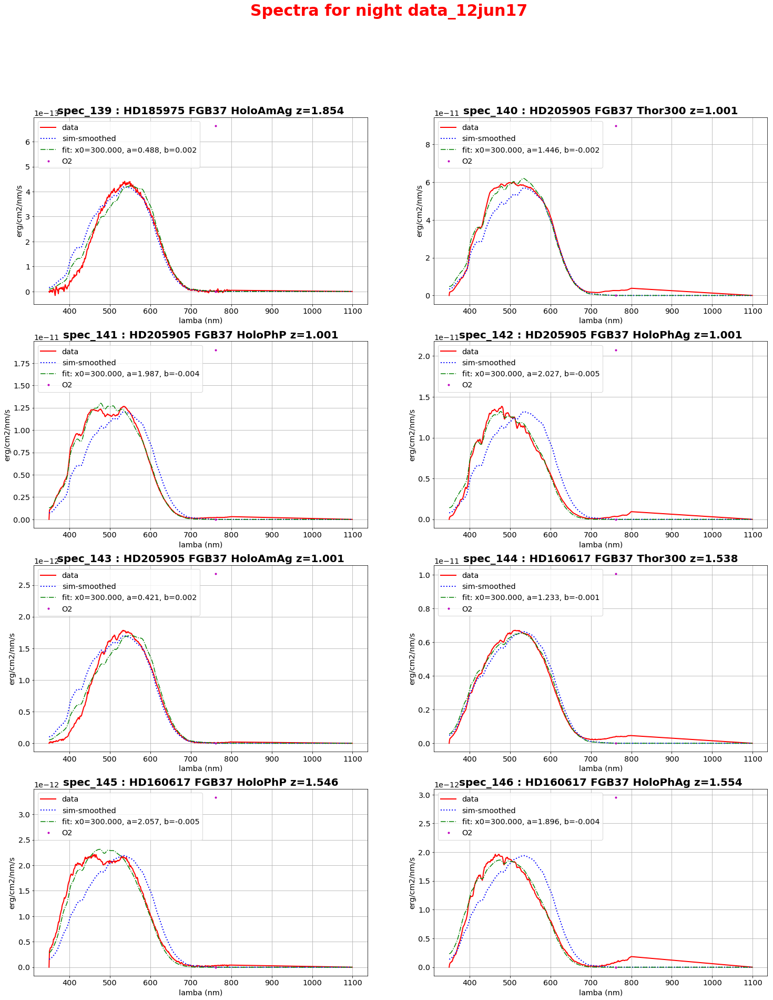

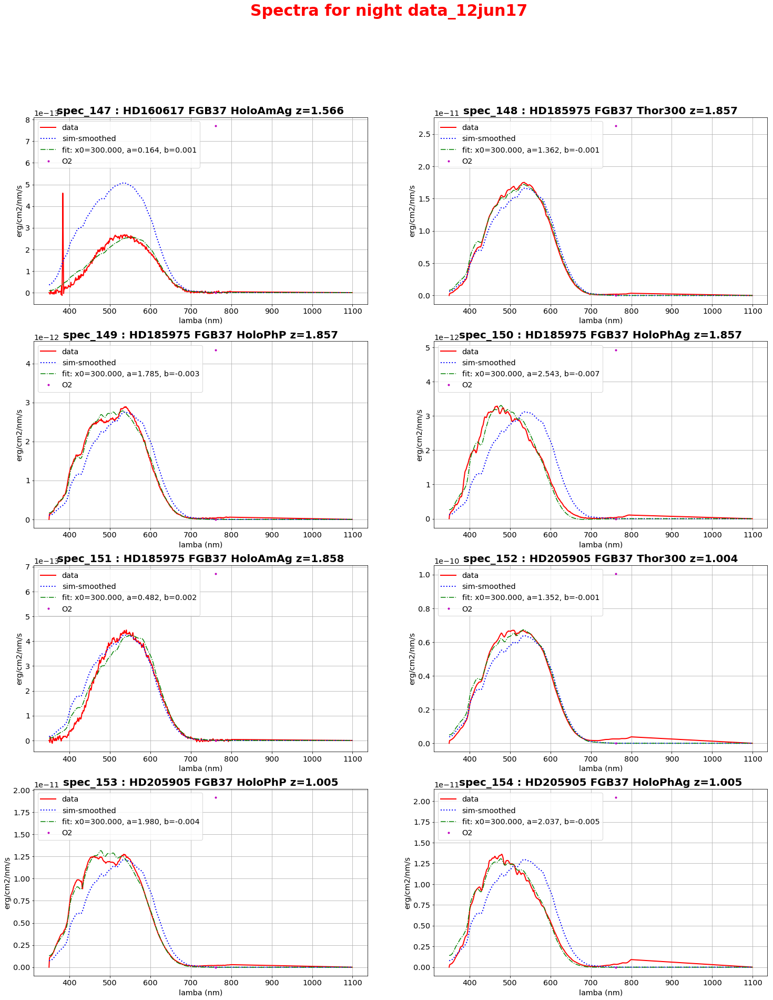

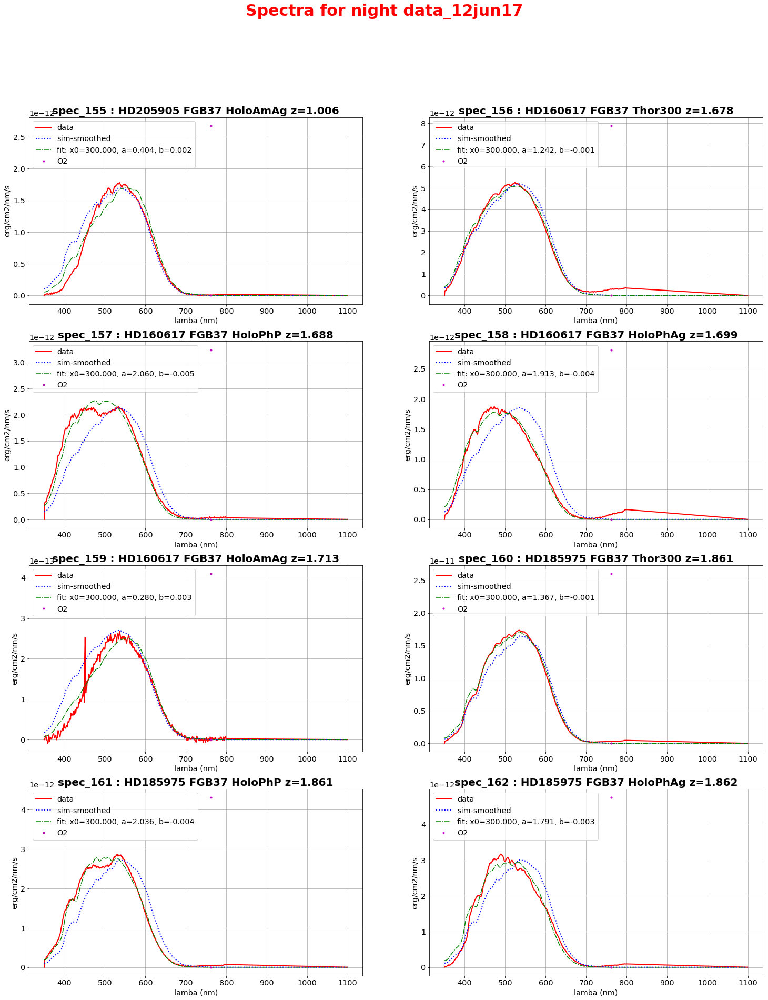

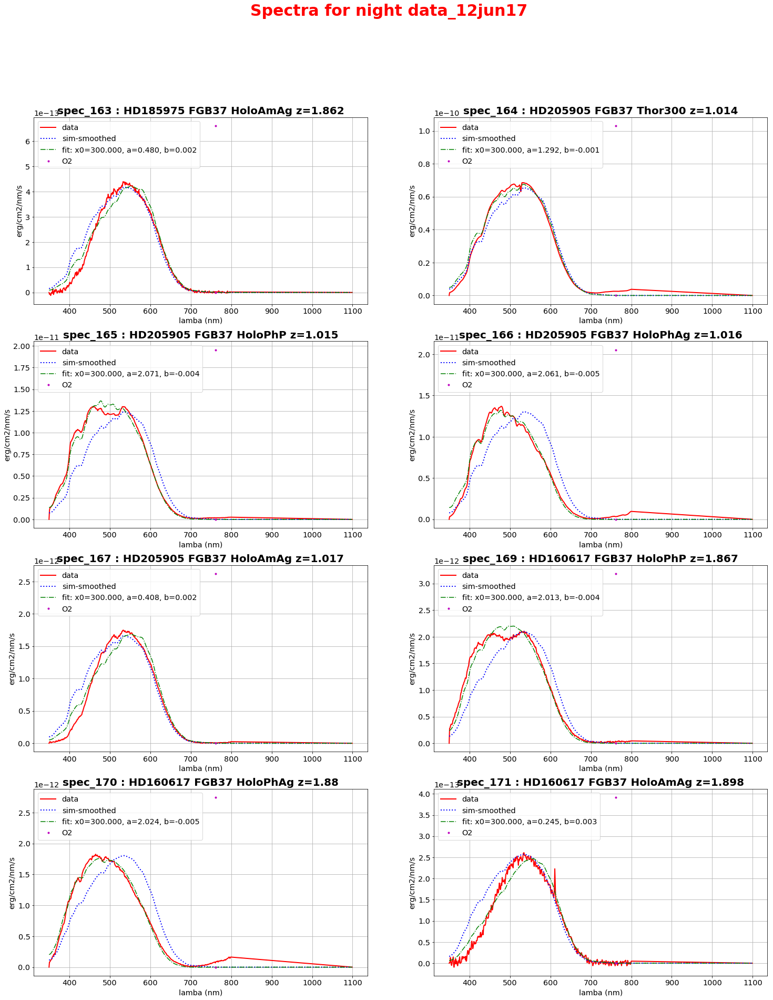

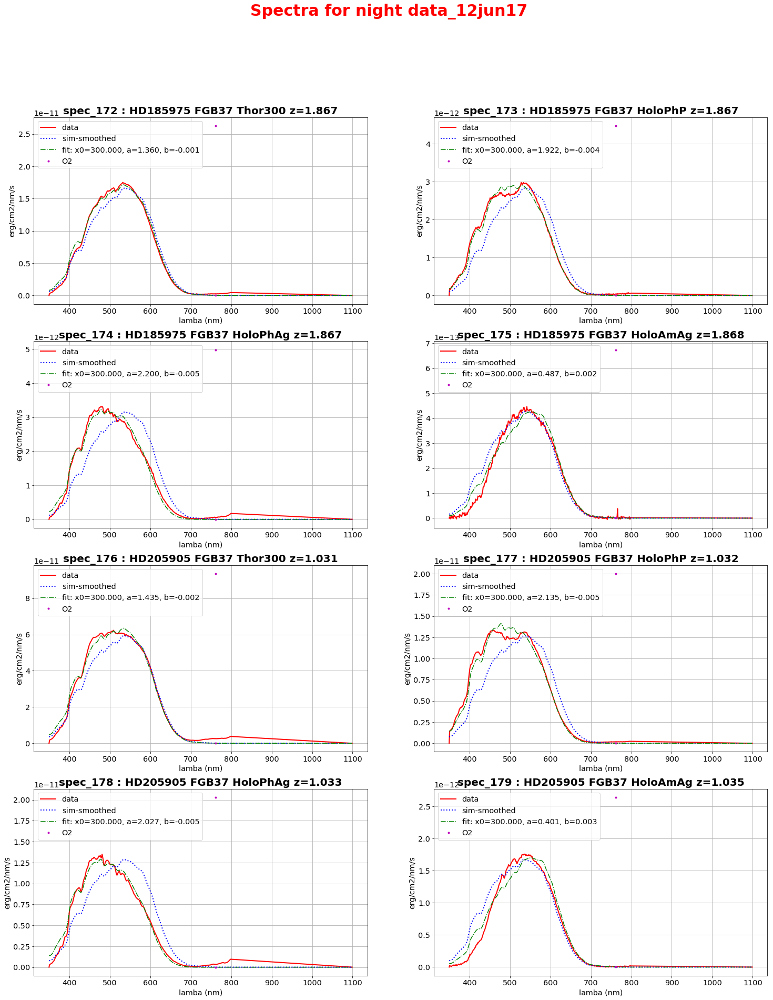

In [158]:
NBPLOTS=NBSPECTRA

all_indexes=[]
all_renormfluxsim=[]
all_data=[]
all_dataerr=[]

title='Spectra for night '+All_Subdirs[idx_sel_subdir]
PageNum=0          # page counter
NBIMGPERROW=2
NBIMGROWPERPAGE=4

figfilename=os.path.join('FitSpectra.pdf')
pp = PdfPages(figfilename) # create a pdf file

# loop on plots
for idx in np.arange(NBPLOTS):
    
    
    if idx%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,fontsize=30,fontweight='bold',color='red')
            
    # index of image in the page    
    index=idx-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
    ix=index%NBIMGPERROW
    iy=index/NBIMGPERROW
                        
    filename=all_spectrafiles[idx]
    file_id=get_index_from_filename(filename,SelectTagRe)
    
     # check if tthe index is in the disperser indexes 
    basefn=os.path.basename(filename)                  # basename of reconstruced spectra
    basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
    simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
    
    
    all_indexes.append(file_id)
    
    hdu1 = fits.open(filename)
    hdu2 = fits.open(simfilename)
       
    data1=hdu1[0].data
    head1=hdu1[0].header
    
    wl1=data1[0]
    f1=data1[1]
    ef1=data1[2]
   
    hdu2 = fits.open(simfilename)
    data2=hdu2[0].data
    
    wl2=data2[0]
    f2=data2[1]
    #f3=smooth(f2)
    f3=smooth(f2,window_len=21)
    
    gain=f1.max()/f2.max()
    
    # renormelize scale of simu
    f2=f3*gain

    # extend range for (wl1,f1)
    wl1=np.insert(wl1,0,wl1[0]-5)
    f1=np.insert(f1,0,0.)  
    ef1=np.insert(ef1,0,0.) 
    
    wl1=np.insert(wl1,0,WL[0])
    f1=np.insert(f1,0,0.) 
    ef1=np.insert(ef1,0,0.)
    
    wl1=np.append(wl1,WL[-1])
    f1=np.append(f1,0.)
    ef1=np.append(ef1,0.)
    
    

    # extend range for (wl2,f3)
    wl2=np.insert(wl2,0,WL[0])
    f2=np.insert(f2,0,0.)            
    wl2=np.append(wl2,WL[-1])
    f2=np.append(f2,0.)


    func1 = interpolate.interp1d(wl1, f1)
    fl1=func1(WL)
    
    efunc1 = interpolate.interp1d(wl1, ef1)
    efl1=efunc1(WL)

    func2 = interpolate.interp1d(wl2, f2)
    fl2=func2(WL)

    s0=fl2

    all_data.append(fl1)
    all_dataerr.append(efl1)
    
    # fit  attenuation 
    # -----------------
    if head1["FILTER2"]=='RG715':
        popt, pcov = curve_fit(functofit, WL, fl1,p0=[550.,1.,0.])
    else:
        popt, pcov = curve_fit(functofit, WL, fl1,p0=[300.,1.,0.])

    # plot
    # --------    
    
    figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
    axarr[iy,ix].set_title(figtitle,fontsize='20',fontweight='bold')
    axarr[iy,ix].plot(WL,fl1,'r-',lw=2,label='data')
    axarr[iy,ix].plot(WL,fl2,'b:',lw=2,label='sim-smoothed')
    axarr[iy,ix].plot(WL,functofit(WL, *popt), 'g-.',label='fit: x0=%5.3f, a=%5.3f, b=%5.3f' % tuple(popt))
    
    all_renormfluxsim.append(functofit(WL, *popt))
    
    
    axarr[iy,ix].plot([O2WL,O2WL],[0.,f1.max()*1.5],'m.',lw=1,label='O2')
    axarr[iy,ix].set_xlabel("lamba (nm)")
    axarr[iy,ix].set_ylabel("erg/cm2/nm/s")
    
    
    axarr[iy,ix].grid(True)
    #axarr[iy,ix].set_xlim(O2WL-100,O2WL+100) 
    axarr[iy,ix].legend() 
    
    hdu1.close()
    hdu2.close()
   
    # save a new page
    if (idx+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
        PageNum+=1  # increase page Number
        f.savefig(pp, format='pdf')
        f.show()
        #break
        
        
    #idx+=1    # increase counter on plots
     

f.savefig(pp, format='pdf') 
f.show()
pp.close()

## Step two : shift the wavelength

In [159]:
all_indexes=np.array(all_indexes)
all_renormfluxsim=np.array(all_renormfluxsim)
all_data=np.array(all_data)
all_dataerr=np.array(all_dataerr)

In [160]:
wavelength_shift=np.arange(-50,51,1)

In [161]:
np.where(all_indexes==4)[0]

array([], dtype=int64)

In [162]:
print all_indexes

[ 51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68
  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86
  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104
 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122
 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140
 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 169 170 171 172 173 174 175 176 177
 178 179]


In [163]:
idx=0

In [164]:
data=all_data[idx]
simu=all_renormfluxsim[idx]
edata=all_dataerr[idx]

In [165]:
data.shape,simu.shape,edata.shape

((750,), (750,), (750,))

In [166]:
def ComputeChi2TimeShift(data,edata,simu):
    """
    Function ComputeChi2TimeShift(data,edata,simu)
    
    input:
        - data
        - edata
        - simu
    output:
    
    """

    all_chi2=[]

    for dwl in wavelength_shift:
        #newsimu=np.roll(simu,dwl)
        newsimu=roll_zeropad(simu,dwl)
        #chi2=np.where(edata>0,(data-newsimu)**2/edata**2,0.)
        chi2=np.where(np.logical_and(data>0.2*data.max(),edata>0),(data-newsimu)**2/edata**2,0.)
        chi2=chi2.sum()
        all_chi2.append(chi2)
    
    return np.array(all_chi2)

/Users/dagoret/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in divide
/Users/dagoret/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in divide


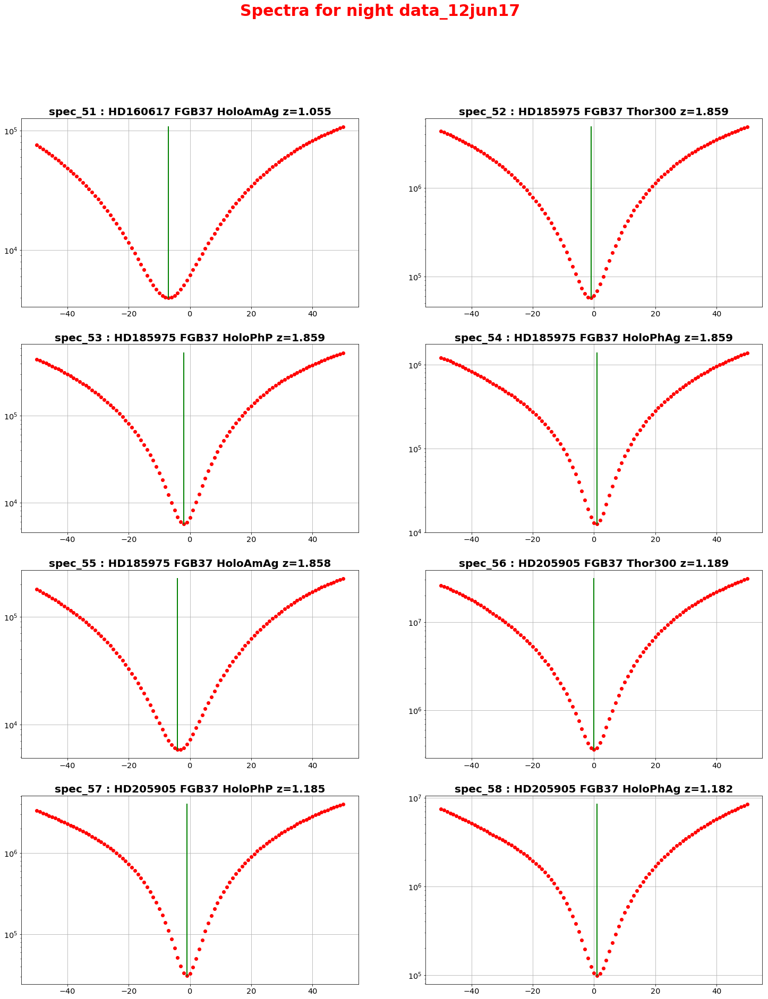

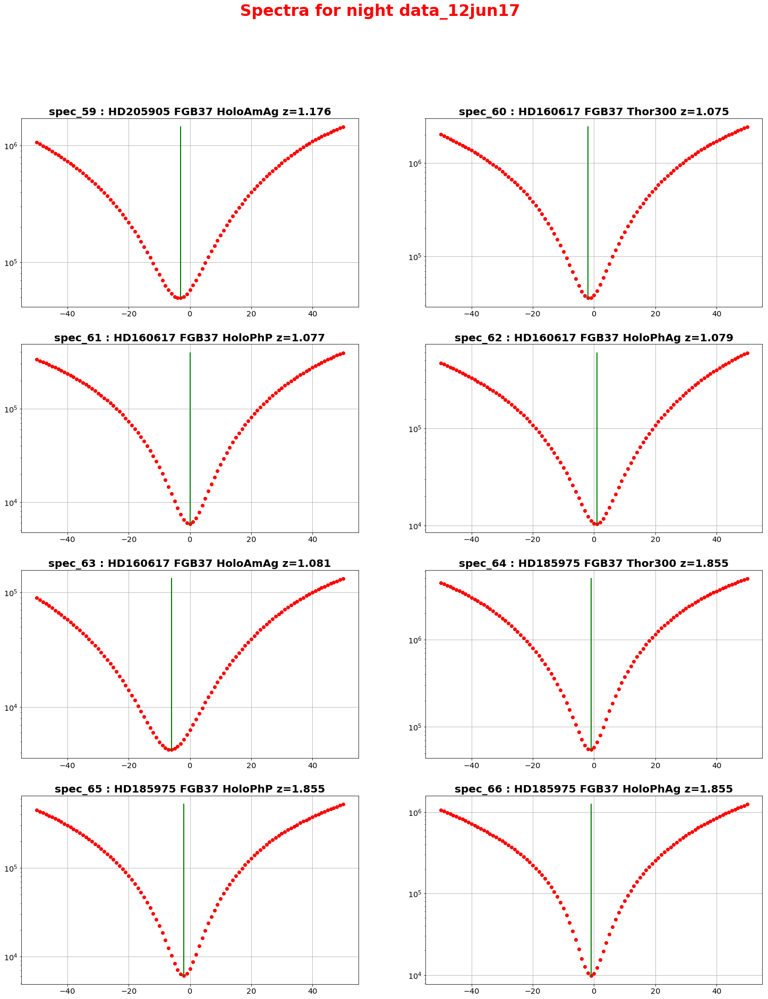

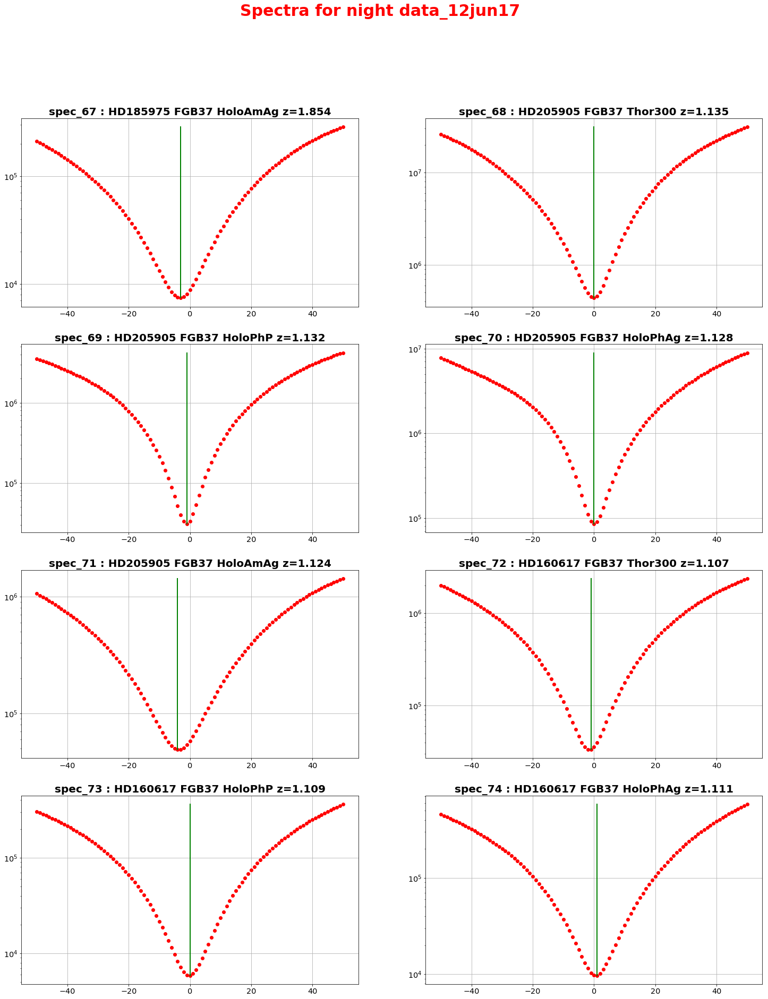

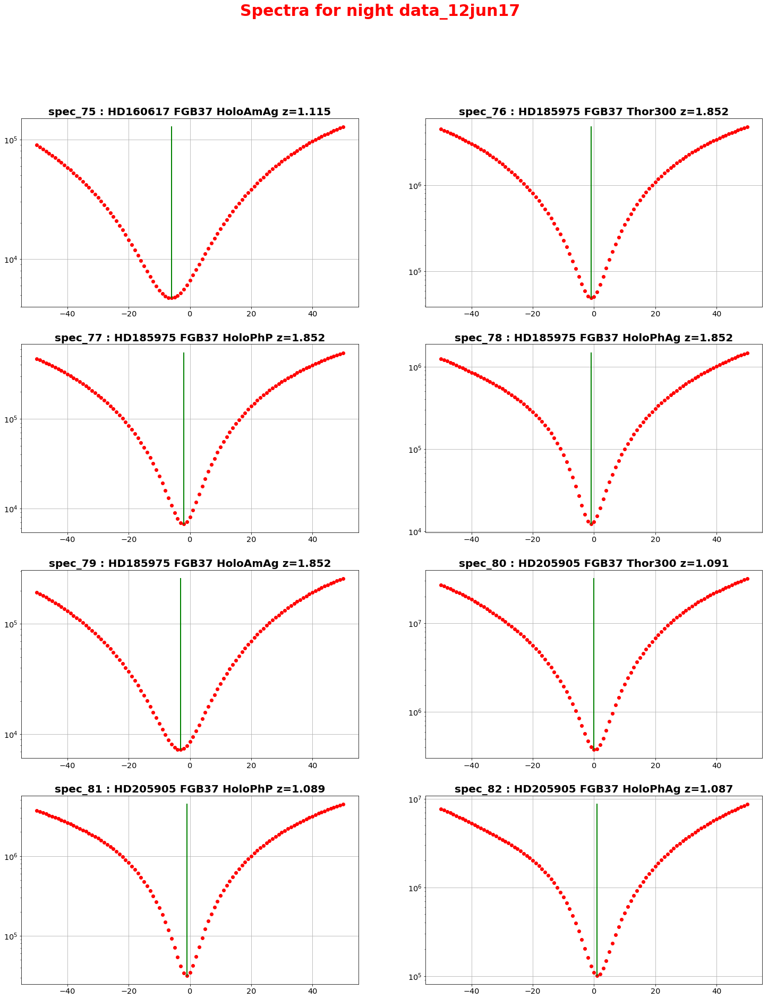

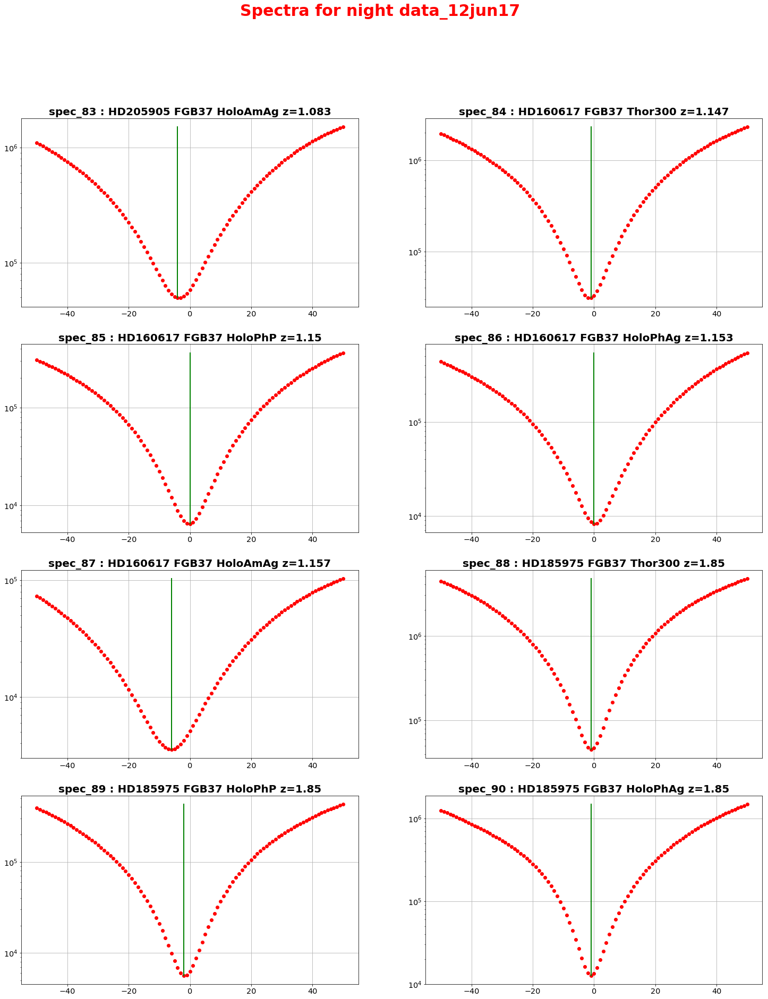

...

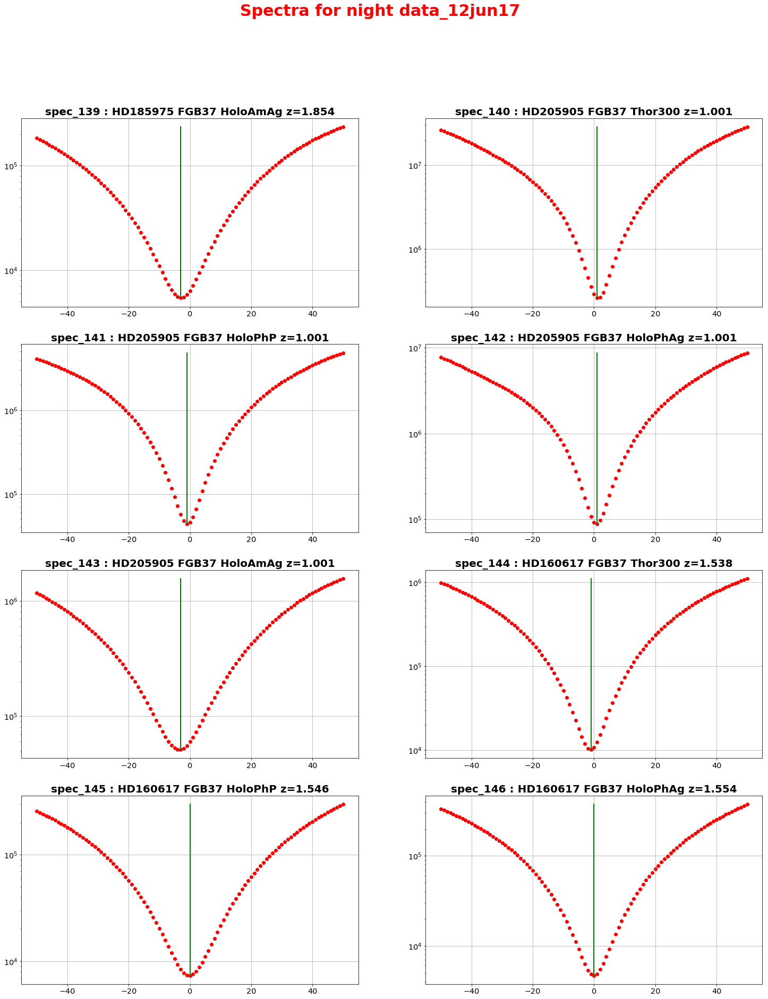

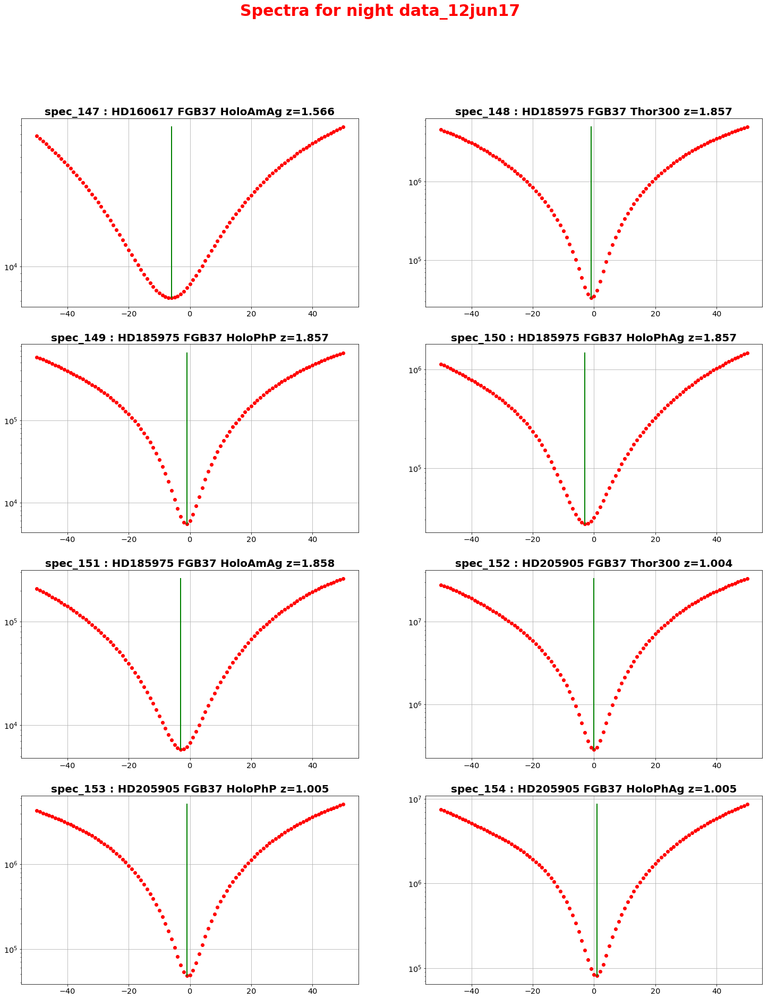

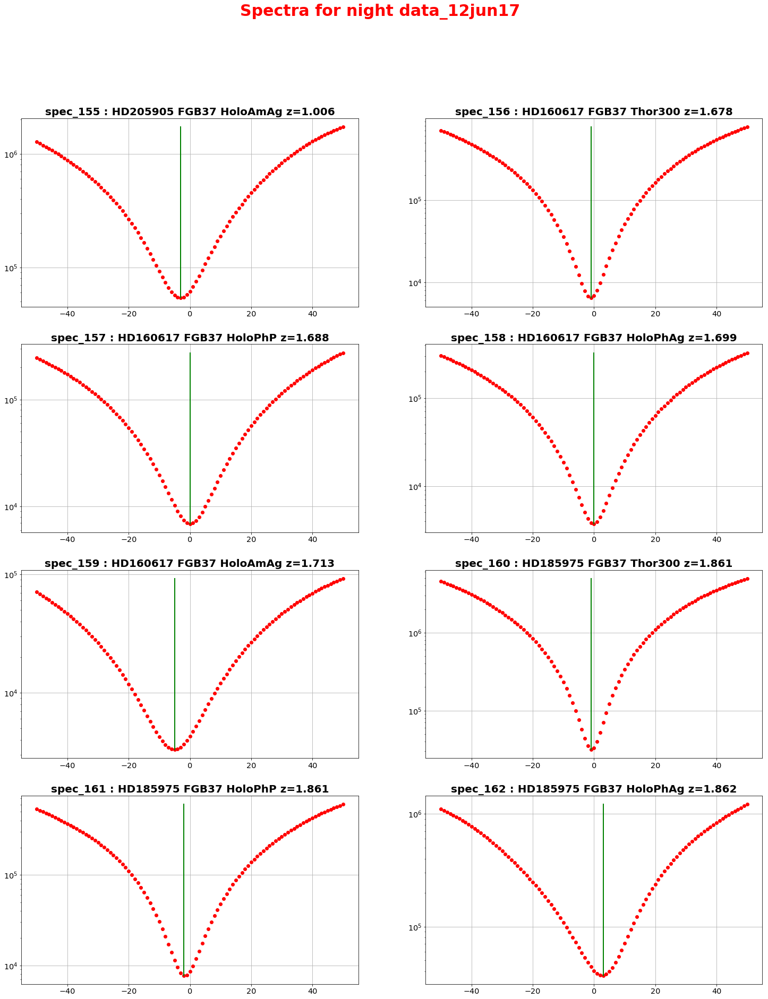

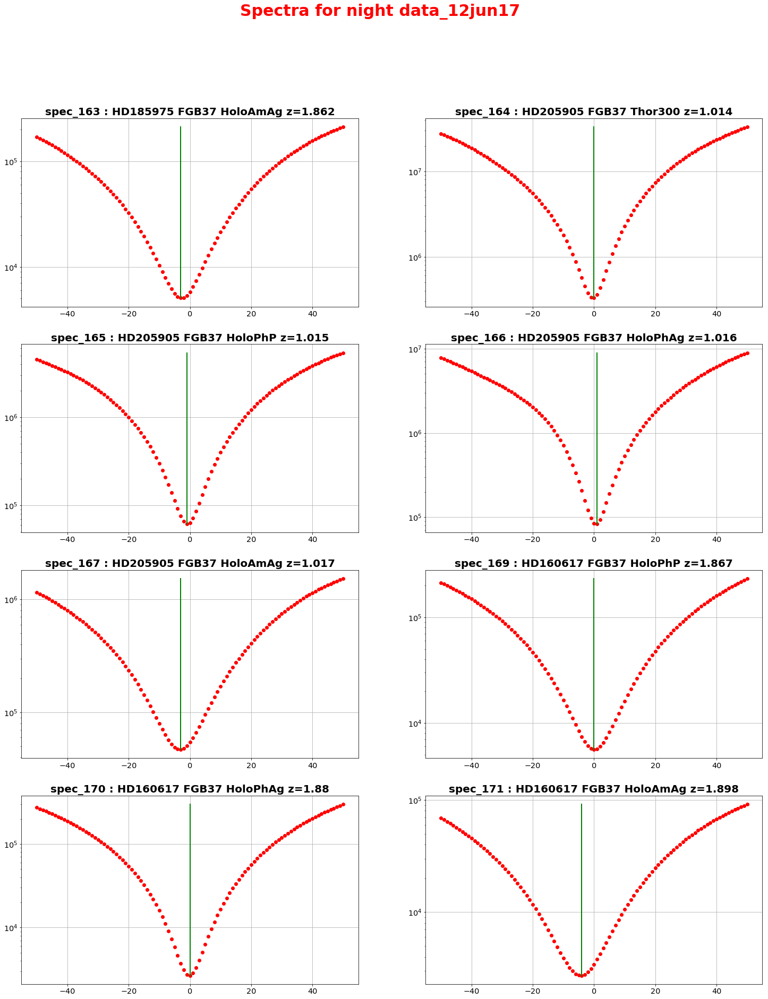

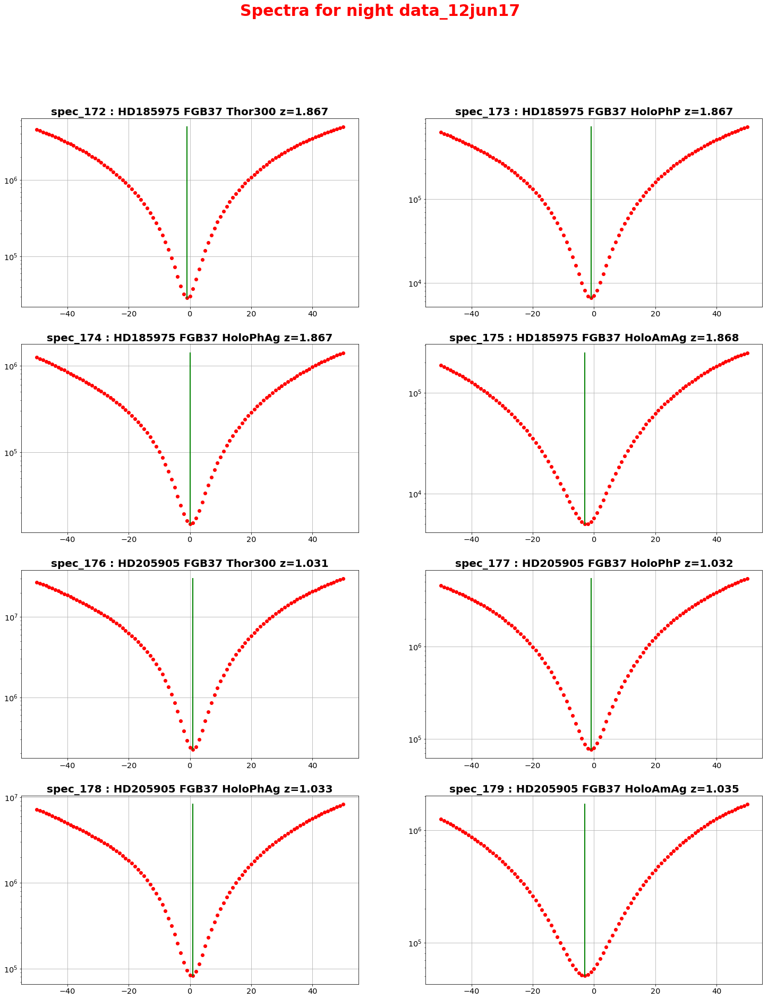

In [167]:
NBPLOTS=NBSPECTRA

all_wavelength_toshift=[]

#definition of the filename and page setup
figfilename=os.path.join('ShiftedSpectraChi2.pdf')
pp = PdfPages(figfilename) # create a pdf file
title='Spectra for night '+All_Subdirs[idx_sel_subdir]
PageNum=0          # page counter
NBIMGPERROW=2
NBIMGROWPERPAGE=4

wavelength_shift=np.arange(-50,51,1)

idx=0 # counter on plots
# loop on plots
for idx in np.arange(NBPLOTS):
       
    if idx%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,fontsize=30,fontweight='bold',color='red')
    
    
    # index of image in the page    
    index=idx-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
    ix=index%NBIMGPERROW
    iy=index/NBIMGPERROW
    
    
    filename=all_spectrafiles[idx]
    
      # check if tthe index is in the disperser indexes 
    basefn=os.path.basename(filename)                  # basename of reconstruced spectra
    basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
    simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
    
    
    #simfilename=all_simspectrafiles1[idx]
    
    file_id=get_index_from_filename(filename,SelectTagRe)
    
    hdu1 = fits.open(filename)
    hdu2 = fits.open(simfilename)
       
    data1=hdu1[0].data
    wl1=data1[0]
    f1=data1[1]
   
    
    figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
    data=all_data[idx]
    simu=all_renormfluxsim[idx]
    edata=all_dataerr[idx]
    
    all_chi2=ComputeChi2TimeShift(data,edata,simu)
    
    idx_timeshift=np.where(all_chi2==all_chi2.min())[0][0]
    ts=wavelength_shift[idx_timeshift]
    
    all_wavelength_toshift.append(ts)
    
    axarr[iy,ix].set_title(figtitle,fontsize='20',fontweight='bold')
    axarr[iy,ix].semilogy(wavelength_shift,all_chi2,'ro',lw=2)
    axarr[iy,ix].semilogy([ts,ts],[all_chi2.min(),all_chi2.max()],'g-',lw=2)
    axarr[iy,ix].grid(True)
    
   
   
    # save a new page
    if (idx+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
        #f.colorbar(im, orientation="horizontal")
        PageNum+=1  # increase page Number
        f.savefig(pp, format='pdf')
        f.show()
        
        
    #idx+=1    # increase counter on plots
    
    
f.savefig(pp, format='pdf') 
f.show()
pp.close()
all_wavelength_toshift=np.array(all_wavelength_toshift)

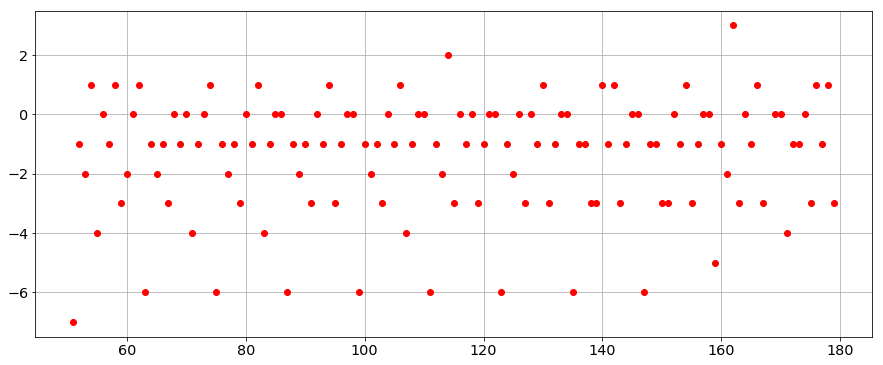

In [168]:
plt.figure(figsize=(15,6))
plt.plot(all_indexes,all_wavelength_toshift,'ro')
plt.grid()

# Final shifted spectra

In [169]:
all_wl_spec_shift=np.zeros(len(all_wavelength_toshift))-all_wavelength_toshift

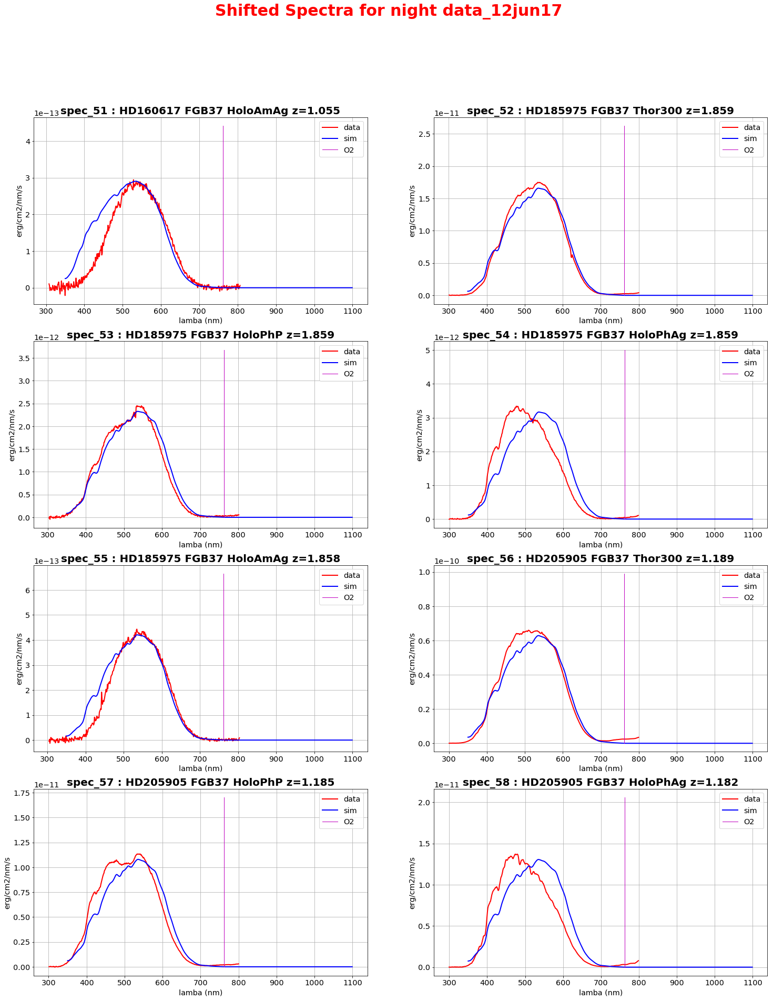

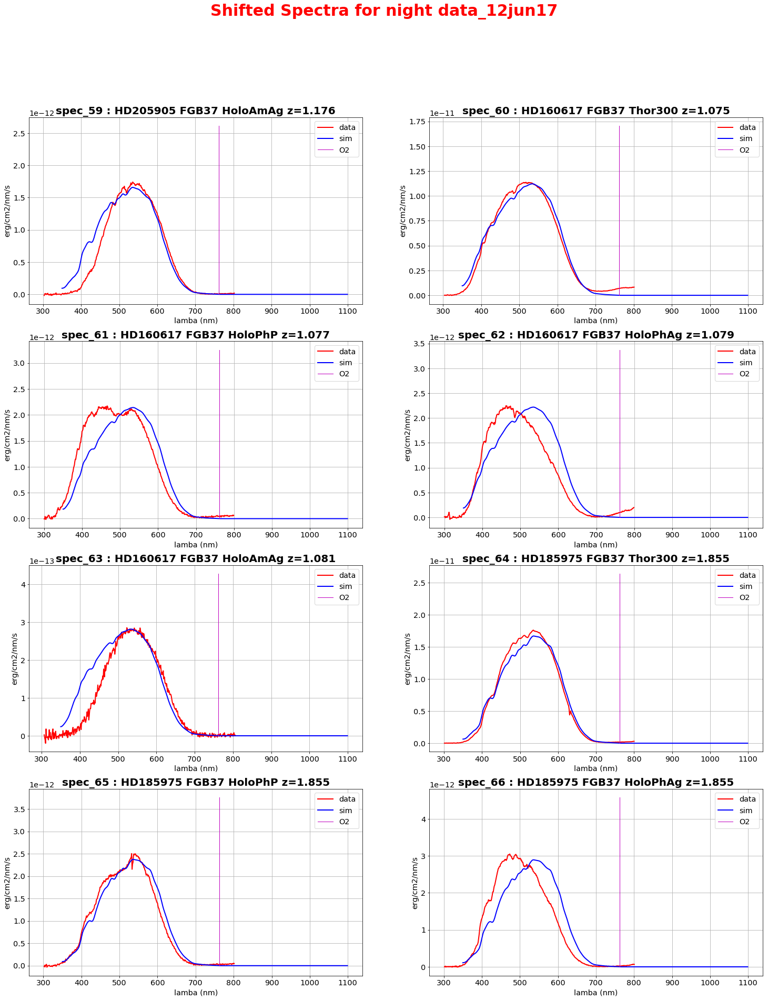

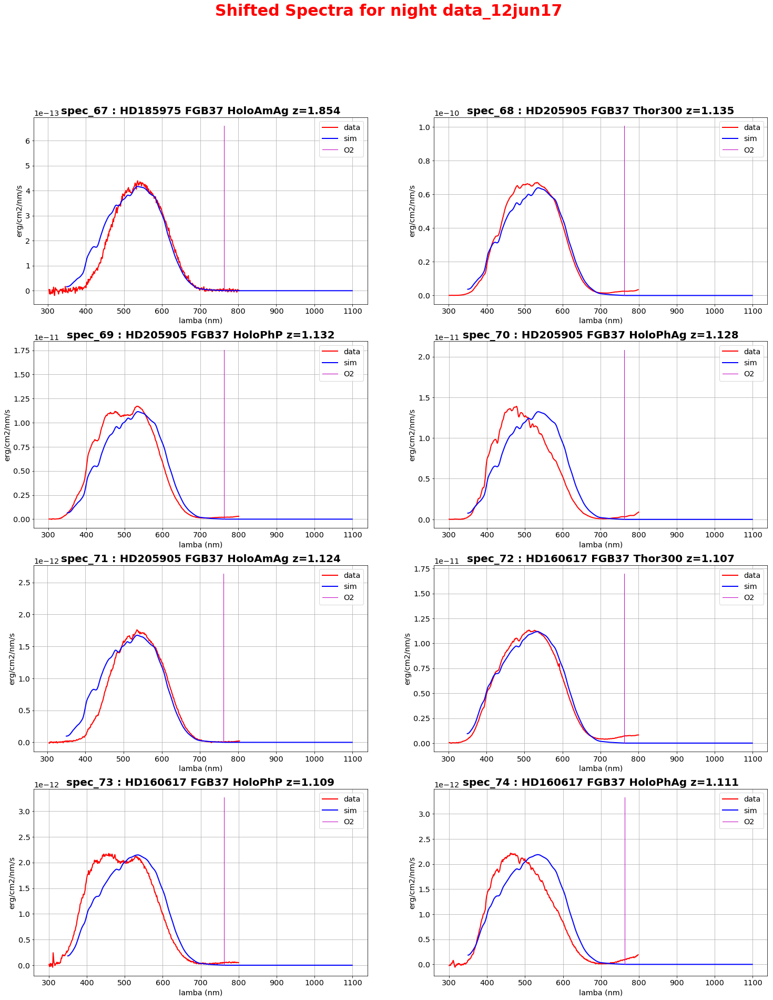

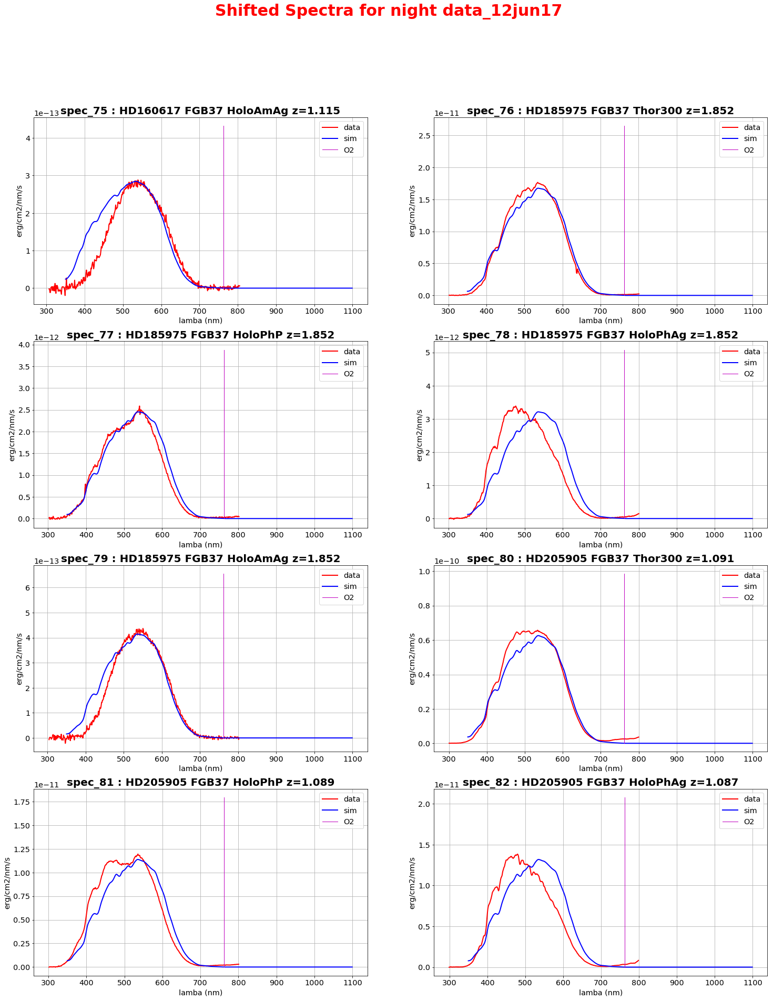

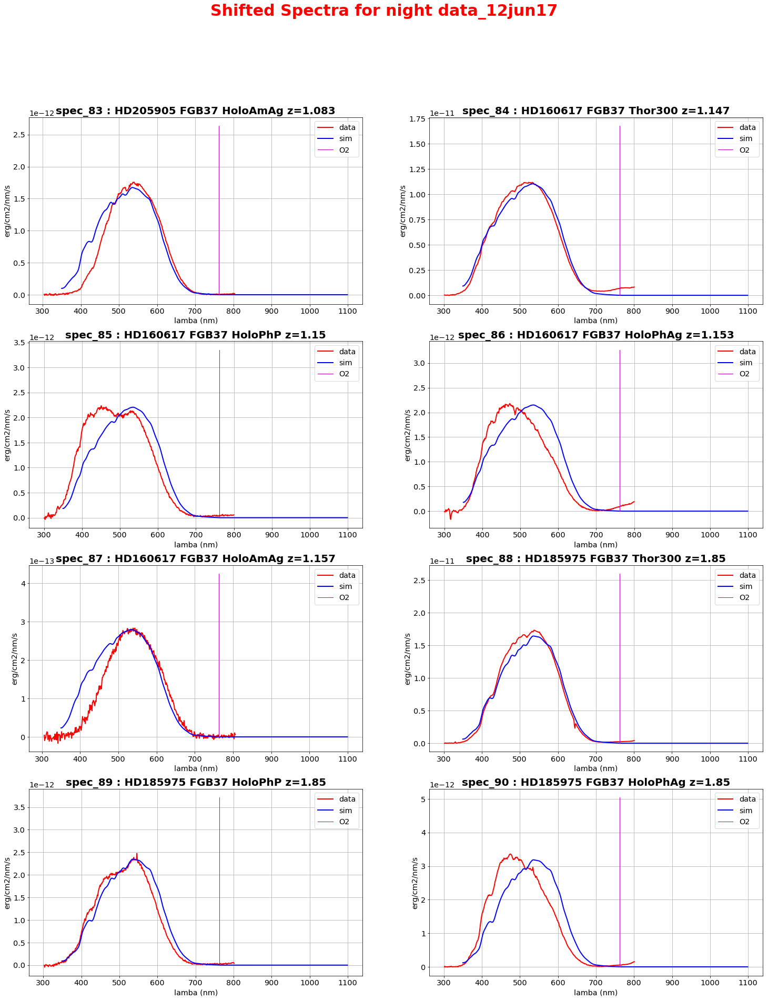

...

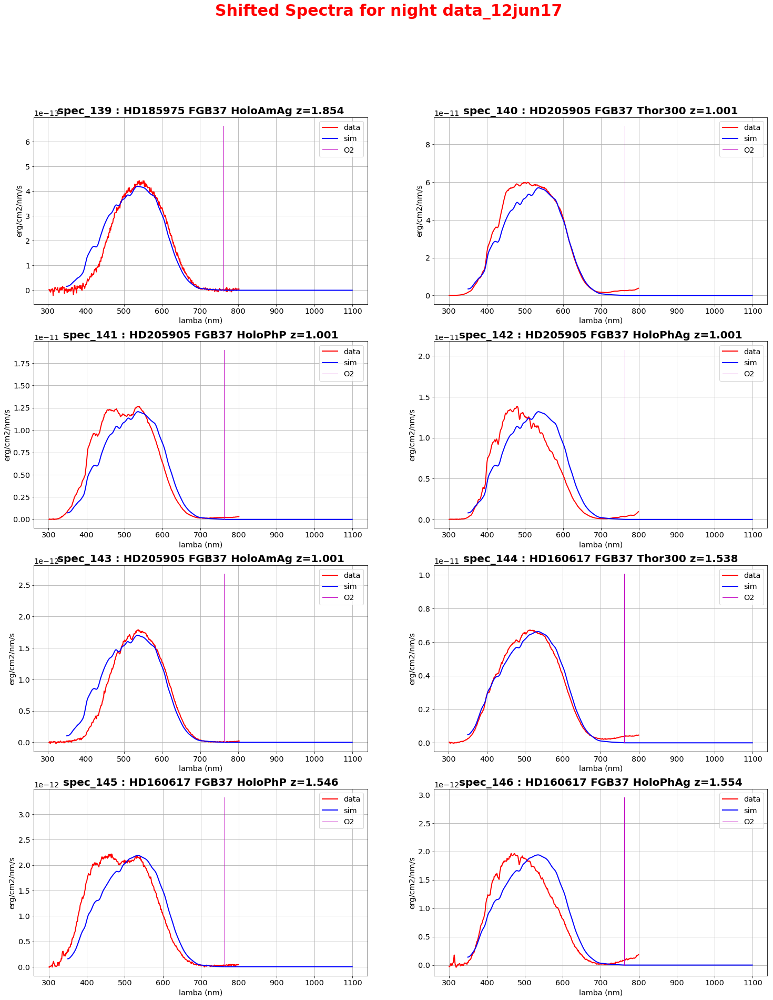

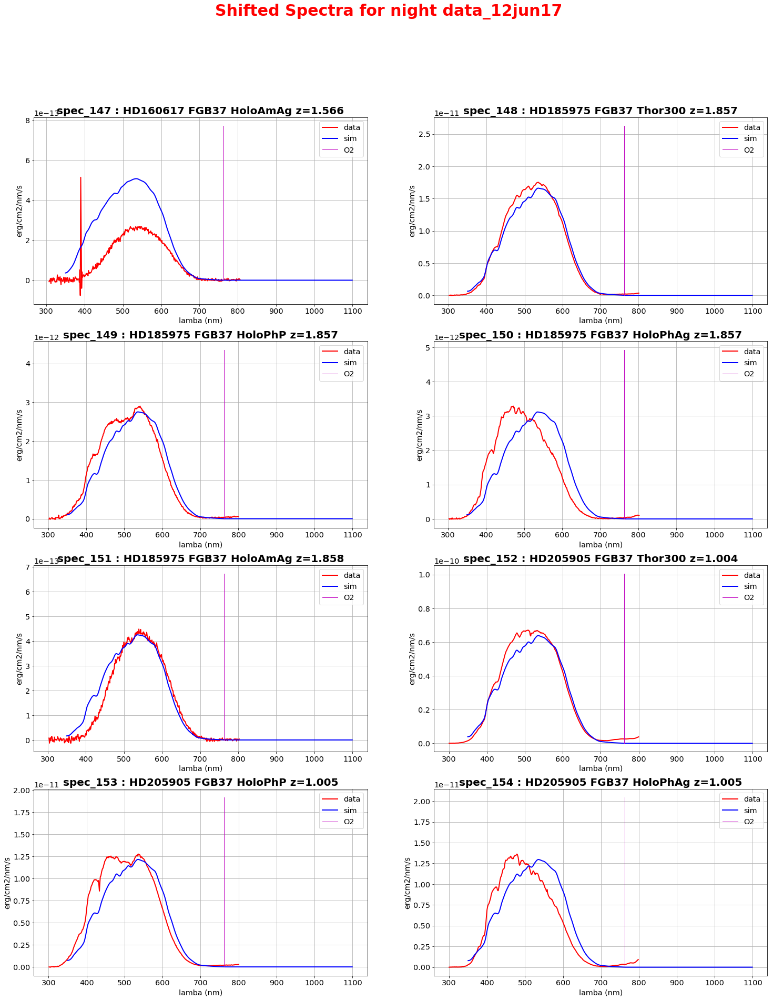

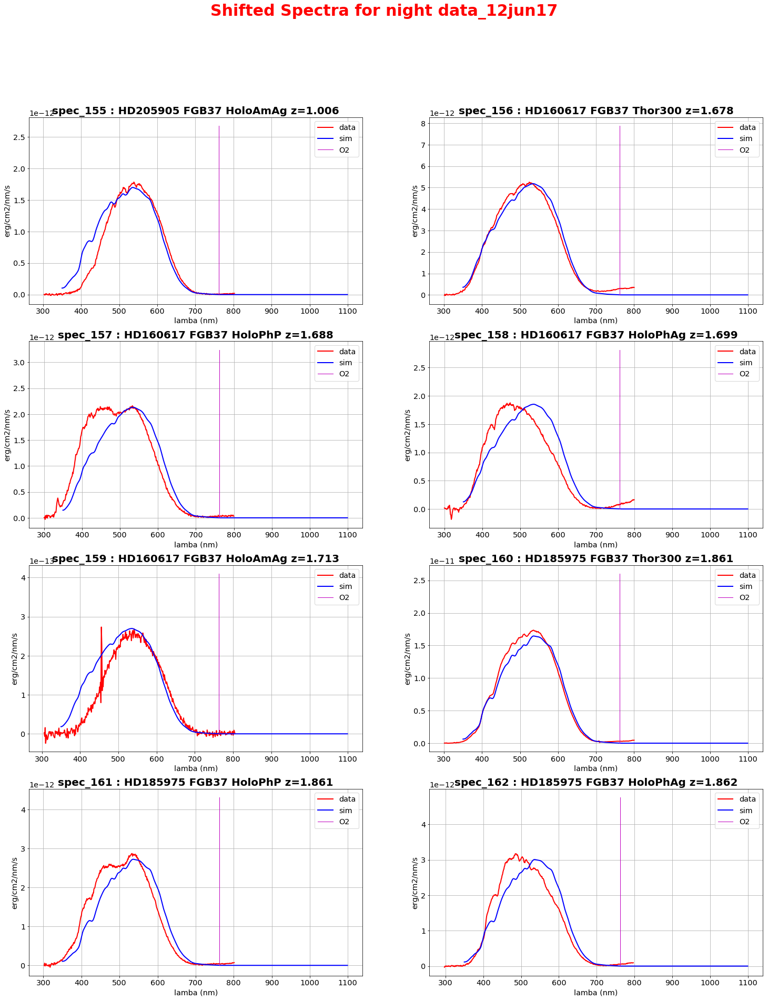

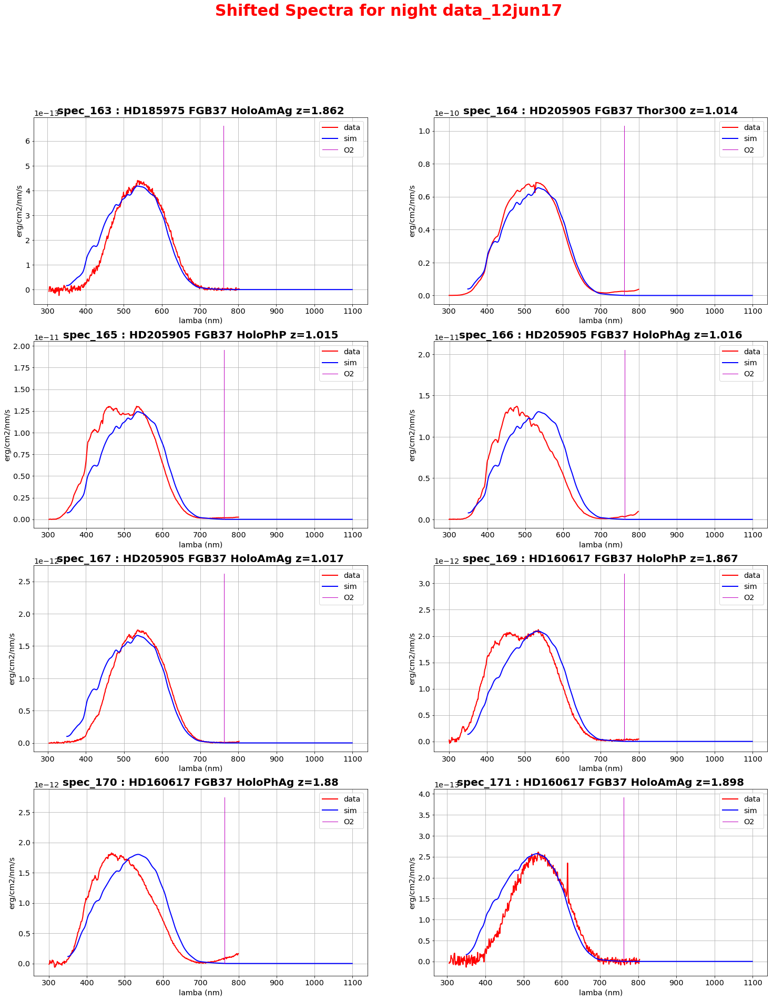

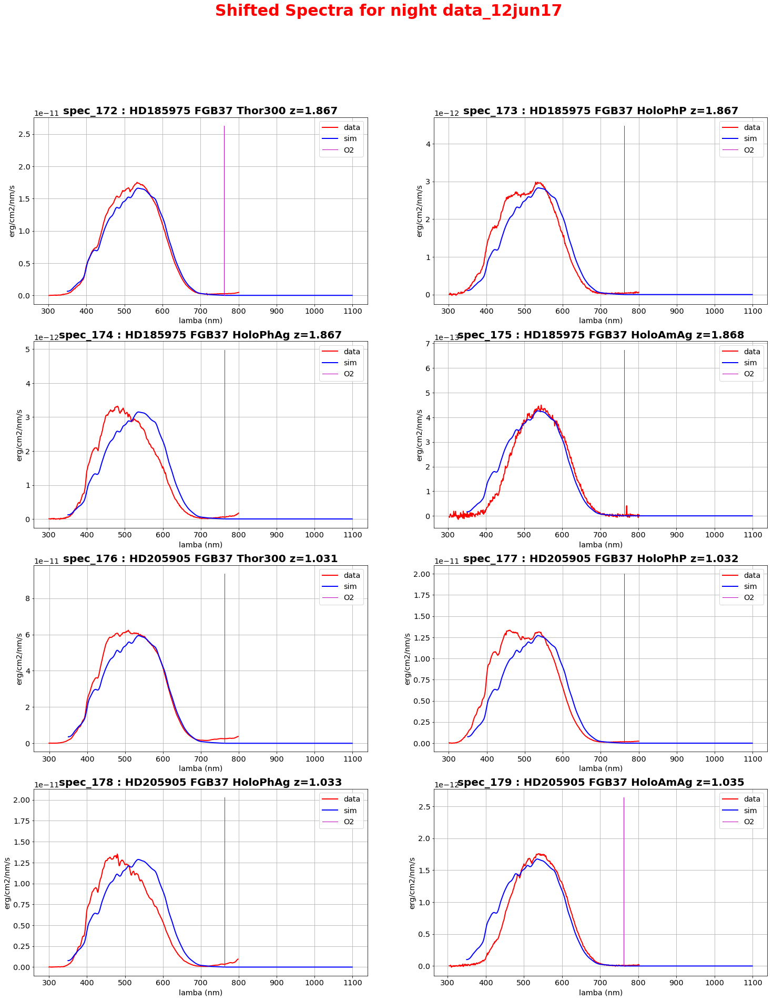

In [170]:
NBPLOTS=NBSPECTRA

title='Shifted Spectra for night '+All_Subdirs[idx_sel_subdir]
PageNum=0          # page counter
NBIMGPERROW=2
NBIMGROWPERPAGE=4

figfilename=os.path.join('ShiftedSpectra.pdf')
pp = PdfPages(figfilename) # create a pdf file

# loop on plots
for idx in np.arange(NBPLOTS):
    
    
    if idx%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,fontsize=30,fontweight='bold',color='red')
            
    # index of image in the page    
    index=idx-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
    ix=index%NBIMGPERROW
    iy=index/NBIMGPERROW
                        
    filename=all_spectrafiles[idx]
    file_id=get_index_from_filename(filename,SelectTagRe)
    
     # check if tthe index is in the disperser indexes 
    basefn=os.path.basename(filename)                  # basename of reconstruced spectra
    basefn2=basefn.replace('reduc','specsim')  # reconstruct the simulation filename
    simfilename=os.path.join(path_sim3,basefn2)  # add the path for the simulated file
    

    
    hdu1 = fits.open(filename)
    hdu2 = fits.open(simfilename)
       
    data1=hdu1[0].data
    head1=hdu1[0].header
    
    wl1=data1[0]
    f1=data1[1]
    ef1=data1[2]
   
    hdu2 = fits.open(simfilename)
    data2=hdu2[0].data
    
    wl2=data2[0]
    f2=data2[1]
    #f3=smooth(f2)
    f3=smooth(f2,window_len=21)
    
    gain=f1.max()/f2.max()
    
    # renormelize scale of simu
    f2=f3*gain




    # plot
    # --------    
    
    figtitle='spec_'+str(file_id)+' : '+hdu1[0].header['TARGET']+' '+hdu1[0].header['FILTER1']+' '+hdu1[0].header['FILTER2']+' z='+str(hdu1[0].header['AIRMASS'])
    
    axarr[iy,ix].set_title(figtitle,fontsize='20',fontweight='bold')
    axarr[iy,ix].plot(wl1+all_wl_spec_shift[idx],f1,'r-',lw=2,label='data')
    axarr[iy,ix].plot(wl2,f2,'b-',lw=2,label='sim')

    
    axarr[iy,ix].plot([O2WL,O2WL],[0.,f1.max()*1.5],'m-',lw=1,label='O2')
    axarr[iy,ix].set_xlabel("lamba (nm)")
    axarr[iy,ix].set_ylabel("erg/cm2/nm/s")
    
    
    axarr[iy,ix].grid(True)
    #axarr[iy,ix].set_xlim(O2WL-100,O2WL+100) 
    axarr[iy,ix].legend() 
    
    hdu1.close()
    hdu2.close()
   
    # save a new page
    if (idx+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
        PageNum+=1  # increase page Number
        f.savefig(pp, format='pdf')
        f.show()
        #break
        
        
    #idx+=1    # increase counter on plots
     

f.savefig(pp, format='pdf') 
f.show()
pp.close()

# Save file

In [171]:
df=pd.DataFrame()

In [172]:
df["index"]=all_indexes
df["wlshift"]=all_wl_spec_shift

In [173]:
df=df.set_index("index")

In [174]:
df.to_csv('wavelength_shift.csv')

In [175]:
df.head()

,wlshift
index,
51,7.0
52,1.0
53,2.0
54,-1.0
55,4.0
